# **CVPS20 // Edge Detection in Uniformly-Sampled Data: Part 2**

*September 29, 2020*

In this notebook, we combine filtering and differencing to identifying sharp boundaries in both 1-dimensional and 2-dimensional data.

---

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import imageio as iio
from scipy.ndimage.filters import gaussian_filter as gf

<ipython-input-5-f38629e1fc13>:4: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter as gf


In [6]:
plt.rcParams["figure.figsize"] = (10, 7)
plt.rcParams["image.interpolation"] = "nearest"
plt.rcParams["image.cmap"] = "gist_gray"

### Gradients as Edge Detectors

As before, let's define a clean and noisy step function,

In [ ]:
# -- generate a smooth step function
xxc = np.linspace(-100., 100., 200)
yyc = 1.0 * (xxc > 20.)

# -- generate a noisy step function
np.random.seed(3597)
xxr = np.linspace(-100., 100., 50)
yyr = 1.0 * (xxr > 20.) + 0.2 * np.random.randn(xxr.size)

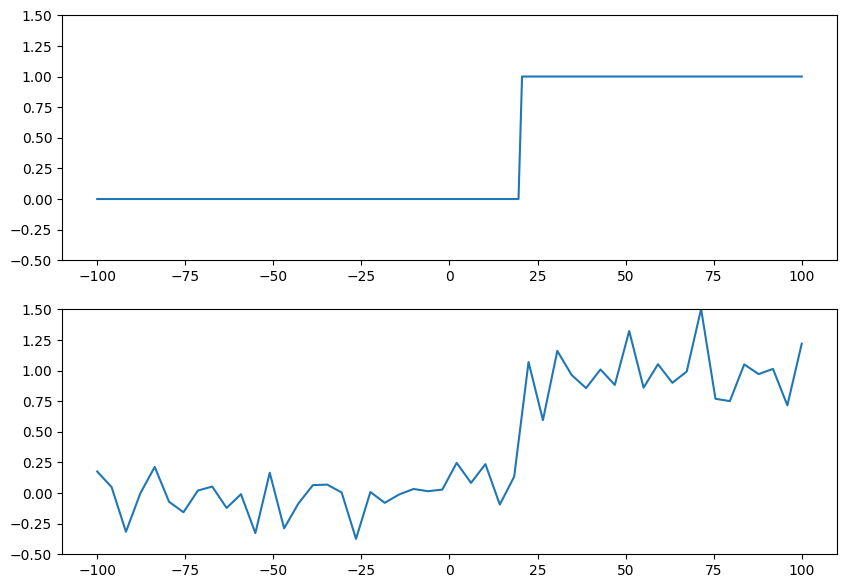

In [ ]:
# -- plot the data sets
fig, ax = plt.subplots(2, 1)
ax[0].plot(xxc, yyc)
ax[1].plot(xxr, yyr)
ax[0].set_ylim(-0.5, 1.5)
ax[1].set_ylim(-0.5, 1.5)
fig.show()

Notice that these data sets both contain an "**edge**" at $x = 20$.  One way of detecting that edge in the clean case, is to simply take the difference between every successive point (closely related to the gradient),

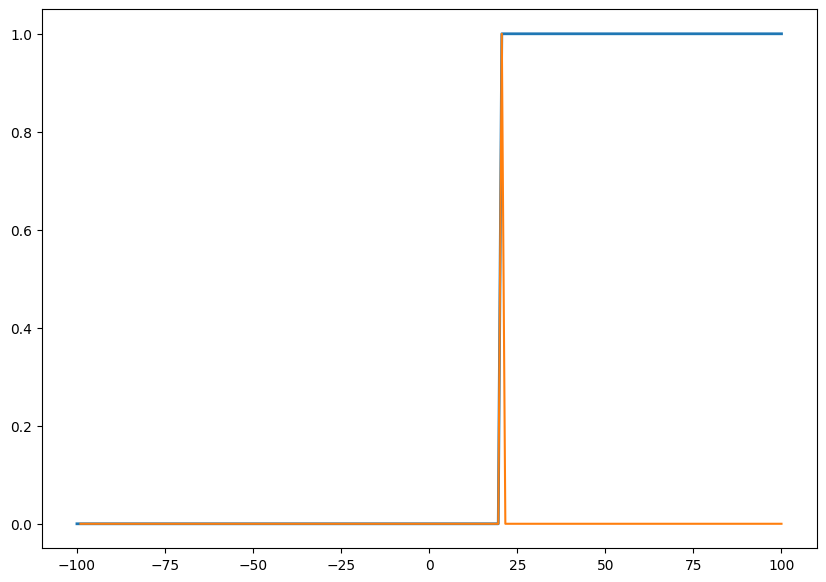

In [ ]:
# -- take difference with each successive point of the clean step function
plt.plot(xxc, yyc, lw=2)
plt.plot(xxc[1:], yyc[1:] - yyc[:-1])

In this clean case, the edge occurs where the gradient is non-zero.  But what about more complicated cases with noise and sampling that is more coarse?

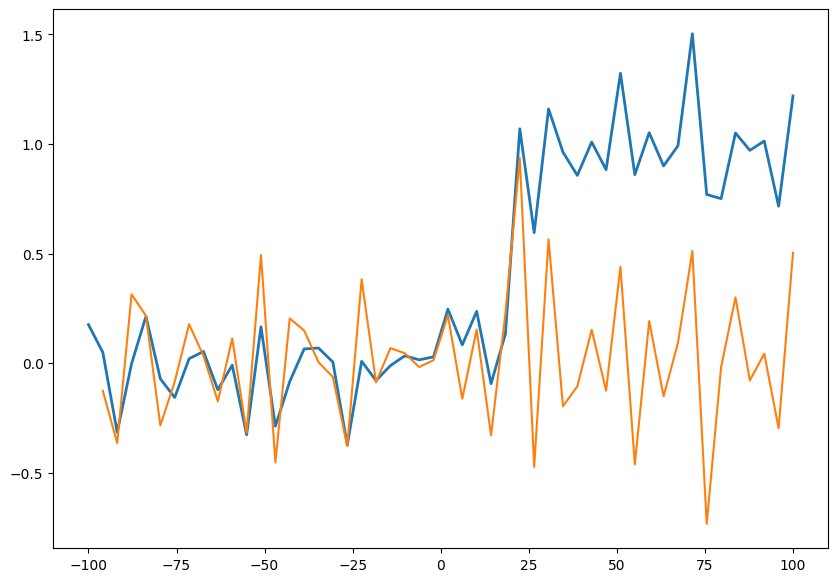

In [ ]:
# -- take difference with each successive point of the noisy step function
plt.plot(xxr, yyr, lw=2)
plt.plot(xxr[1:], yyr[1:] - yyr[:-1])

The maximum of the gradient is still roughly at the edge location, but it is much more difficult to discern whether that maximum is sufficient to consitute an "edge".

Of course, we can do the same thing in 2D to attempt to find edges in images:

In [ ]:
# -- read in an image
fname = "https://whyy.org/wp-content/uploads/2018/01/UD-pic-1-768x432.jpg"
img = np.asarray(iio.imread(fname)) / 255.

# -- create luminosity image
imgL = img.mean(axis=2)

<ipython-input-8-d68124688445>:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = np.asarray(iio.imread(fname)) / 255.


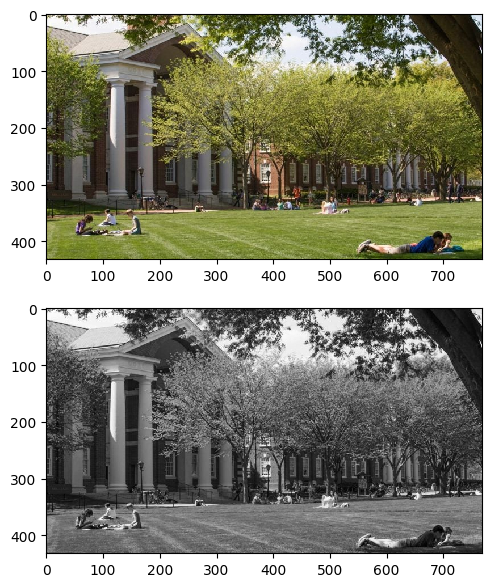

In [ ]:
# -- plot it
fig, ax = plt.subplots(2, 1)
ax[0].imshow(img)
ax[1].imshow(imgL)
fig.show()

Shift each **row** by one **column** and subtract,

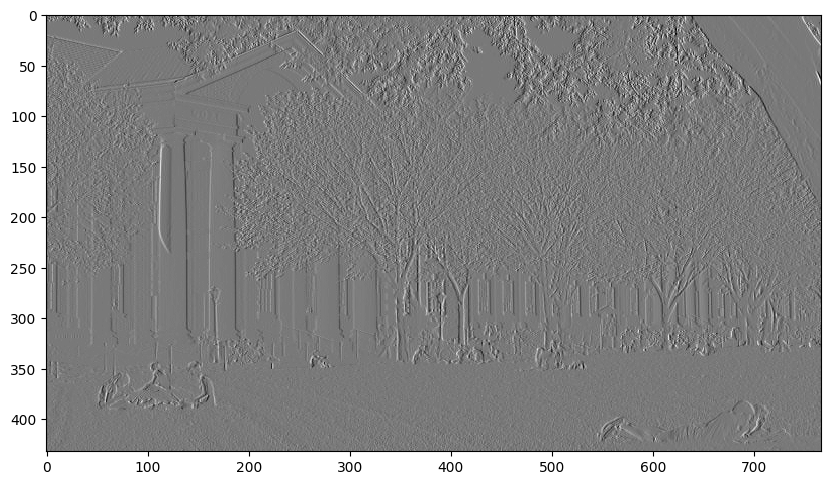

In [ ]:
# -- take the column difference
plt.imshow(imgL[:, 1:] - imgL[:, :-1])

Or, shift by 1 **row** and subtract,

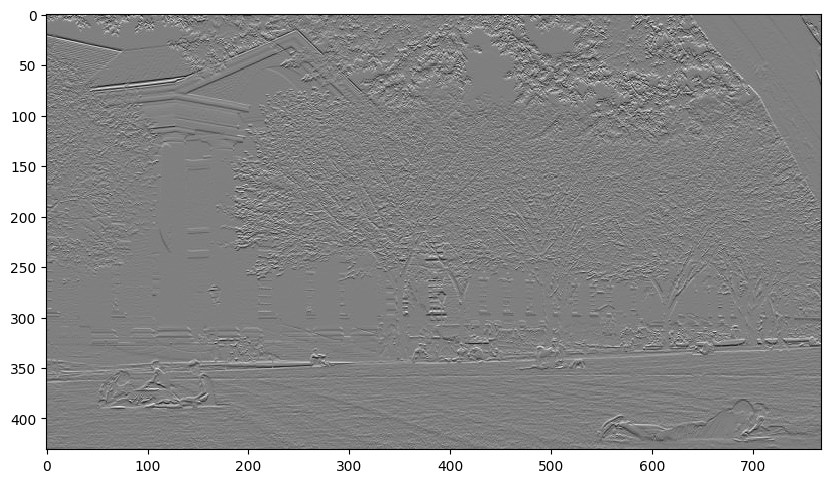

In [ ]:
# -- row difference
plt.imshow(imgL[1:, :] - imgL[:-1, :])

This generates "gradients" in each direction, and we can get the "**gradient magnitude**",

In [ ]:
# -- calculate gradient magnitude for a shift of some number of pixels
hor = imgL[1:-1, 1:-1] - imgL[1:-1, :-2]
ver = imgL[1:-1, 1:-1] - imgL[:-2, 1:-1]
tot = np.sqrt(hor**2 + ver**2)

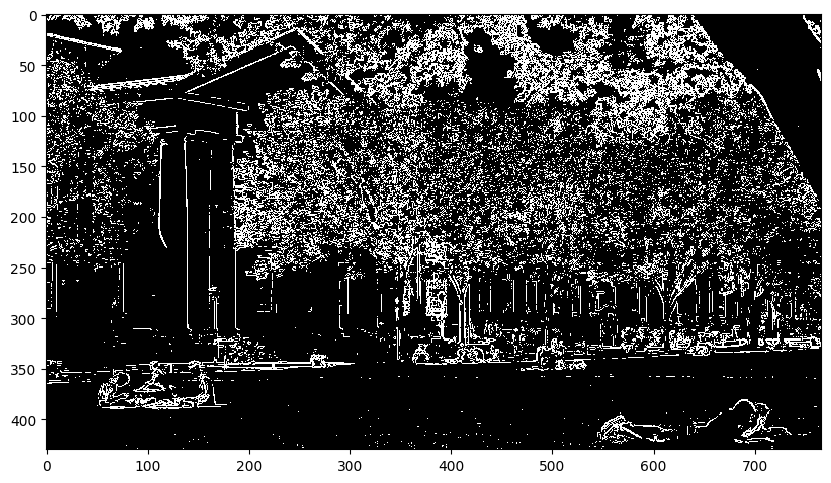

In [ ]:
# -- plot it (and threshold)
plt.imshow(tot > 0.15)

What about an image with more subtle variations and lower resolution?

In [121]:
# -- load image and convert to float
fname = "/content/drive/My Drive/cvps20/data/examples/axons_eye.jpg"
axons = np.asarray(iio.imread(fname))[10:280, 10:350] / 255.

# -- create luminosity image
axonsL = axons.mean(axis=-1)

<ipython-input-121-61df1bbc2289>:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  axons = np.asarray(iio.imread(fname))[10:280, 10:350] / 255.


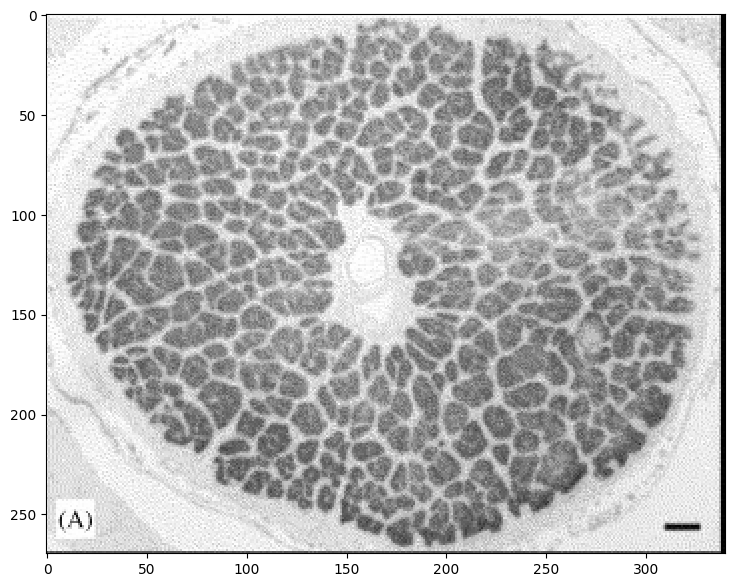

In [ ]:
plt.imshow(axonsL)

In [ ]:
hor = axonsL[1:-1, 1:-1] - axonsL[1:-1, :-2]
ver = axonsL[1:-1, 1:-1] - axonsL[:-2, 1:-1]
tot = np.sqrt(hor**2 + ver**2)

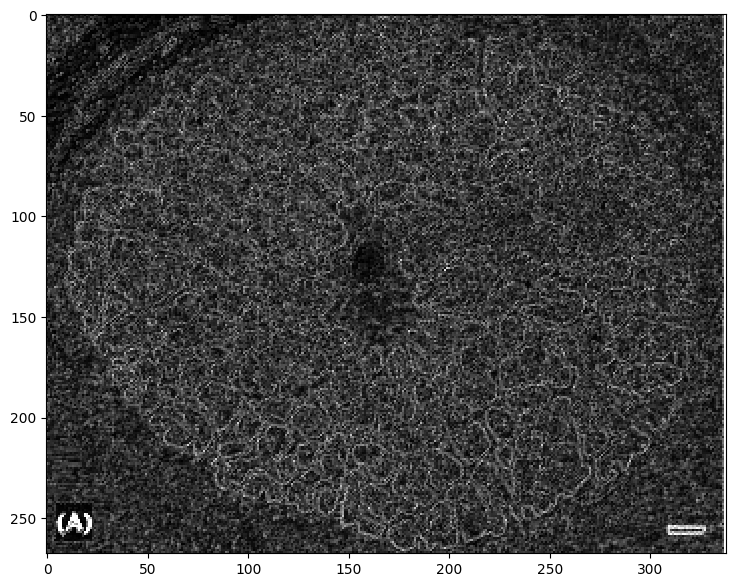

In [ ]:
plt.imshow(tot, clim=[0, 0.5])

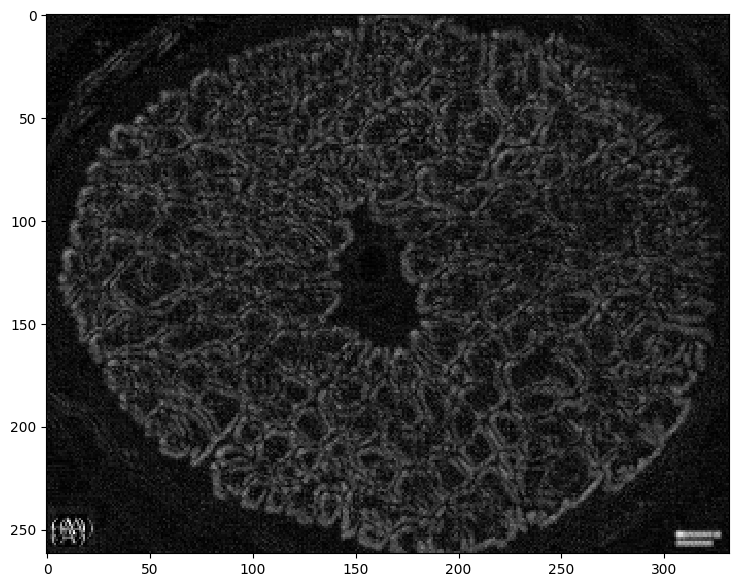

In [ ]:
# -- shift by several pixels
wid = 4

hor = axonsL[wid:-wid, wid:-wid] - axonsL[wid:-wid, :-2*wid]
ver = axonsL[wid:-wid, wid:-wid] - axonsL[:-2*wid, wid:-wid]
tot = np.sqrt(hor**2 + ver**2)

plt.imshow(tot)

---

### The Sobel Filter

Notice that this differencing process can also be defined in terms of a filter:

> ${\rm img}[1\colon, :] - {\rm img}[\colon-1, :] = \left[
  \begin{array}{cc}
  -1 & -1 \\
  1 & 1 \\
  \end{array}
\right]$

and

> ${\rm img}[:, 1\colon] - {\rm img}[:, \colon-1] = \left[
  \begin{array}{cc}
  -1 & 1 \\
  -1 & 1 \\
  \end{array}
\right]$

A more common filter is the **Sobel Filter**:

> $L_x = \left[
  \begin{array}{ccc}
  +1 & 0 & -1 \\
  +2 & 0 & -2 \\
  +1 & 0 & -1
  \end{array}
\right] * L, \  
L_y = \left[
  \begin{array}{ccc}
  +1 & +2 & +1 \\
   0 &  0 &  0 \\
  -1 & -2 & -1
  \end{array}
\right] * L$

with a magnitude given by $\sqrt{L_x^2 + L_y^2}$.


In [ ]:
# -- define the Sobel filters
sx = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])
sy = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

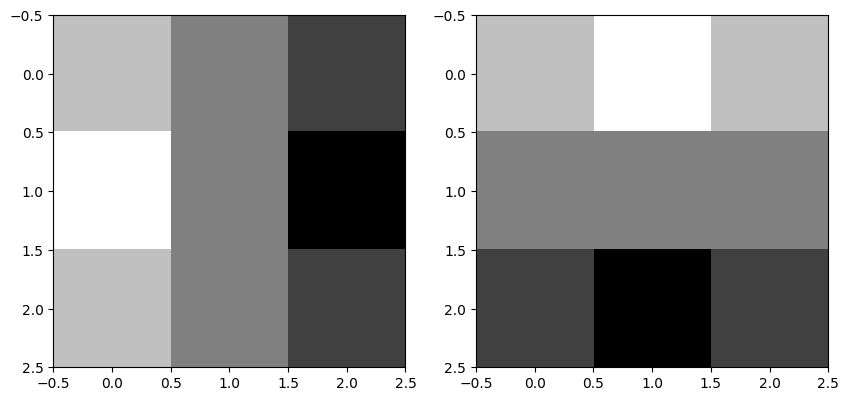

In [ ]:
# -- visualize
fig, ax = plt.subplots(1, 2)
ax[0].imshow(sx)
ax[1].imshow(sy)
fig.show()

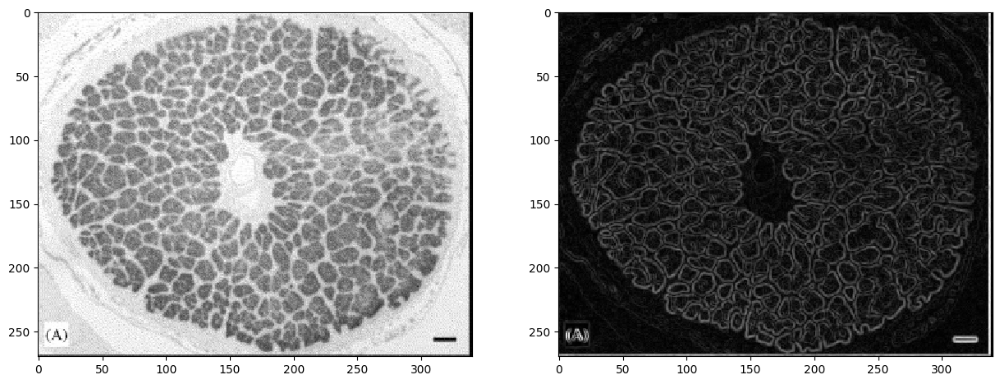

In [122]:
# -- note that there is a sobel filter in scipy.ndimage.filters
from scipy.ndimage import sobel

Lx = sobel(axonsL, axis=1)
Ly = sobel(axonsL, axis=0)
LL = np.sqrt(Lx**2 + Ly**2)

fig, ax = plt.subplots(1, 2, figsize=(15, 8))
ax[0].imshow(axonsL)
ax[1].imshow(LL)
fig.show()

---

### Gaussian Differencing and Canny Edge Detectors

Another method for calculating the location of the step in our 1D data is by smoothing with a Gaussian before differencing,

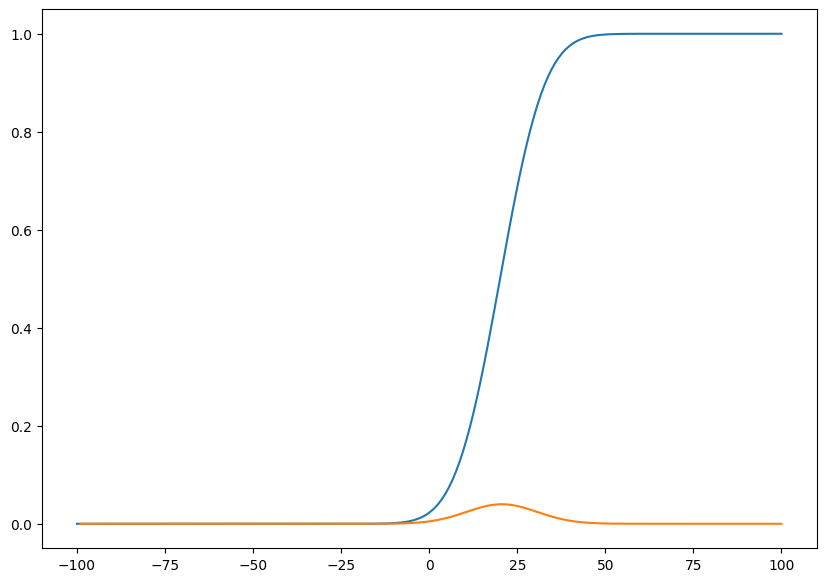

In [ ]:
# -- smooth the clean step function
yyc_sm = gf(yyc, 10)
plt.plot(xxc, yyc_sm)
plt.plot(xxc[1:], yyc_sm[1:] - yyc_sm[:-1])

The maximum in the smoothed difference corresponds to the point at which there is an edge.


And recall that filtering **suppresses noise** in your data,

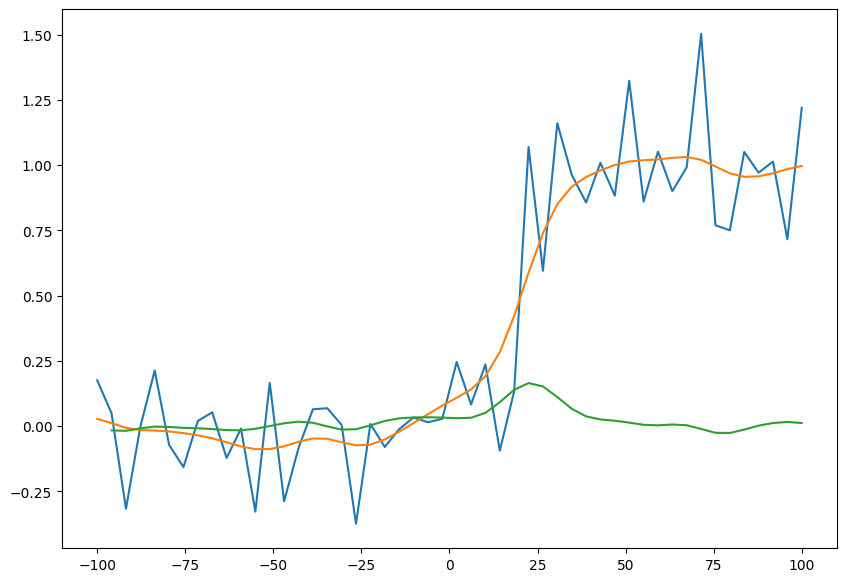

In [ ]:
# -- smooth the noisy step function
yyr_sm = gf(yyr, 2)
plt.plot(xxr, yyr)
plt.plot(xxr, yyr_sm)
plt.plot(xxr[1:], yyr_sm[1:] - yyr_sm[:-1])

We can do the same with images in 2D,

In [ ]:
# -- smooth the UD image
imgLsm = gf(imgL, 2)

# -- take the differences
wid = 4

hor = imgLsm[wid:-wid, wid:-wid] - imgLsm[wid:-wid, :-2*wid]
ver = imgLsm[wid:-wid, wid:-wid] - imgLsm[:-2*wid, wid:-wid]
edge = np.sqrt(hor**2 + ver**2)

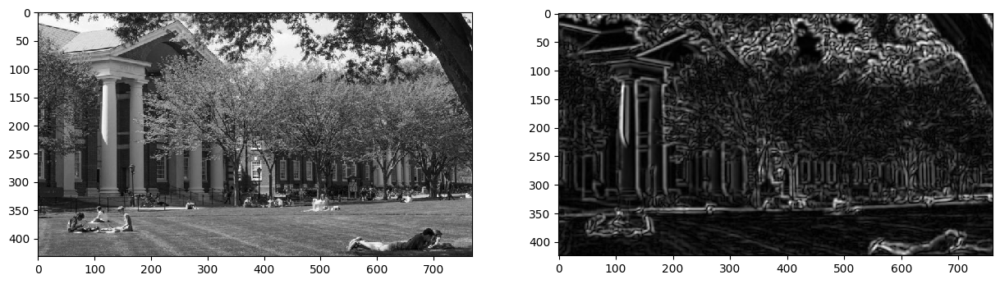

In [ ]:
# -- plot those
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].imshow(imgL)
ax[1].imshow(edge)

fig.show()

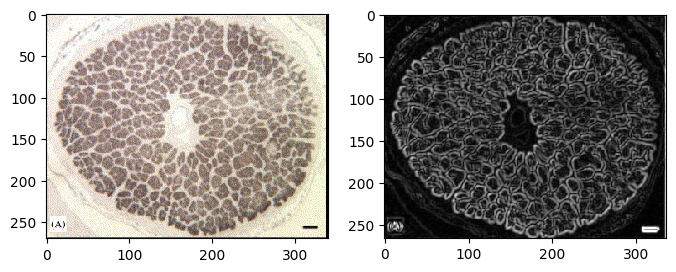

In [ ]:
# -- repeat for axons image
axonsLsm = gf(axonsL, 1)

wid = 2

hor = axonsLsm[wid:-wid, wid:-wid] - axonsLsm[wid:-wid, :-2*wid]
ver = axonsLsm[wid:-wid, wid:-wid] - axonsLsm[:-2*wid, wid:-wid]

edges = np.sqrt(hor**2 + ver**2)

fig, ax = plt.subplots(1, 2, figsize=(8, 8))
ax[0].imshow(axons)
ax[1].imshow(edges, clim=[0, 0.4])

fig.show()

This process is related to **Canny Edge Detection** which has five steps:

1. Gaussian filter the image to remove noise

2. Calculate the gradients of the the image

3. Use non-maximum suppression to select only the pixels that are brightest along the gradient direction

4. Double threshold the remaining pixels into strong edges, weak edges, and not edges

5. Supress all weak edges that are not connected to a strong edge in 8 directions

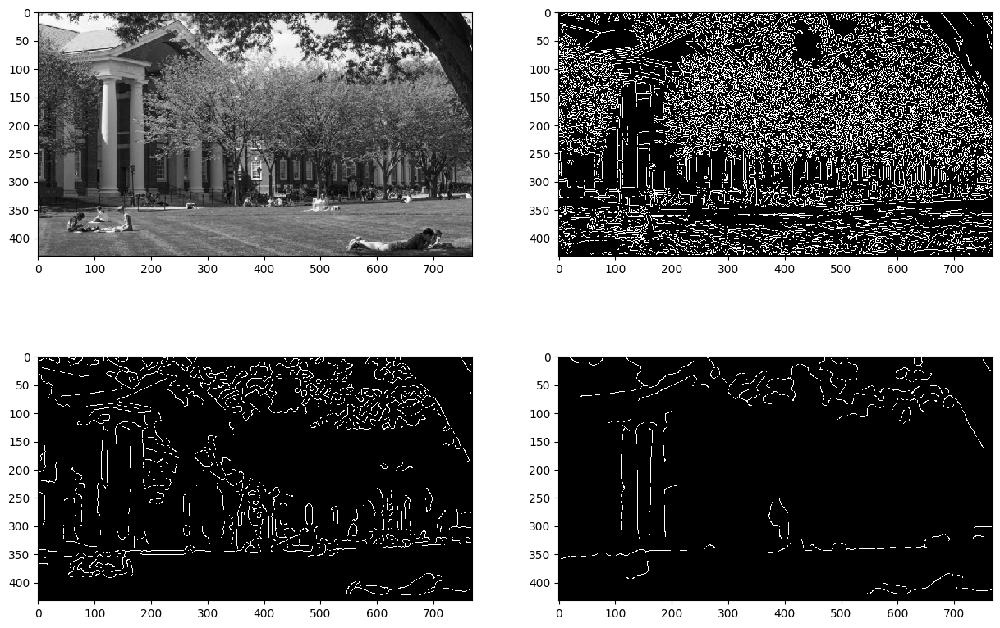

In [ ]:
from skimage.feature import canny

# -- use scikit-image's Canny edge detection implementation
fig, ax = plt.subplots(2, 2, figsize=(15, 10))

ax[0, 0].imshow(imgL)
ax[0, 1].imshow(canny(imgL, sigma=1))
ax[1, 0].imshow(canny(imgL, sigma=3))
ax[1, 1].imshow(canny(imgL, sigma=5))

fig.show()

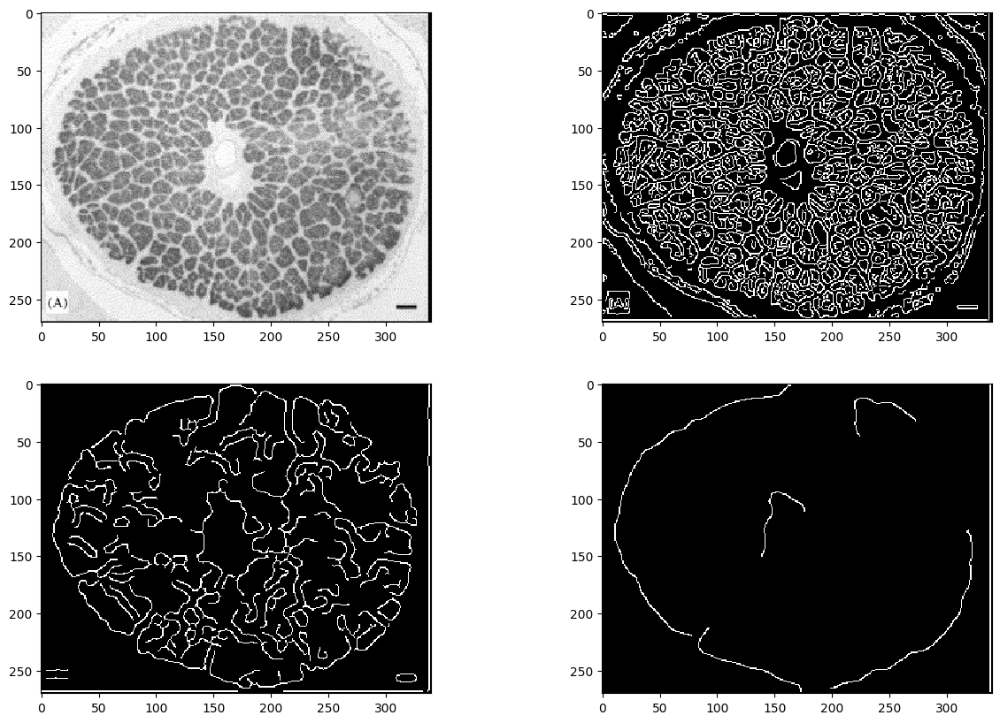

In [ ]:
# -- and the axon image
fig, ax = plt.subplots(2, 2, figsize=(15, 10))

ax[0, 0].imshow(axonsL)
ax[0, 1].imshow(canny(axonsL, sigma=1))
ax[1, 0].imshow(canny(axonsL, sigma=3))
ax[1, 1].imshow(canny(axonsL, sigma=5))

fig.show()

---

### Image Sharpening

Let's pull in the image of the star forming region from last week,

In [25]:
# -- load image and convert to float
fname = "https://www.nasa.gov/sites/default/files/styles/full_width/public/thumbnails/image/ngc6357_0.jpg"
fname = "https://upload.wikimedia.org/wikipedia/commons/1/1f/Cosmic_%E2%80%98Winter%E2%80%99_Wonderland.jpg"
img = np.asarray(iio.imread(fname)) / 255.
imgL = img.mean(-1)

<ipython-input-25-a096cdc7df16>:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = np.asarray(iio.imread(fname)) / 255.


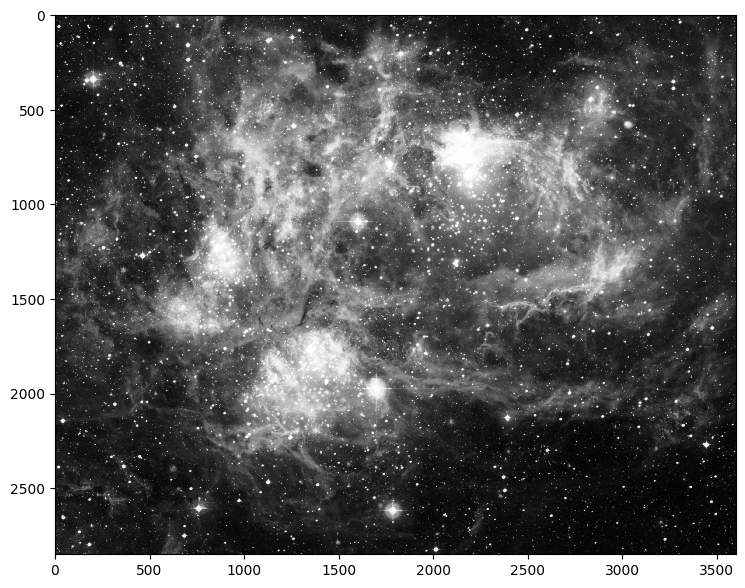

In [26]:
# -- plot it
plt.imshow(imgL)

Now let's smooth the luminosity image,

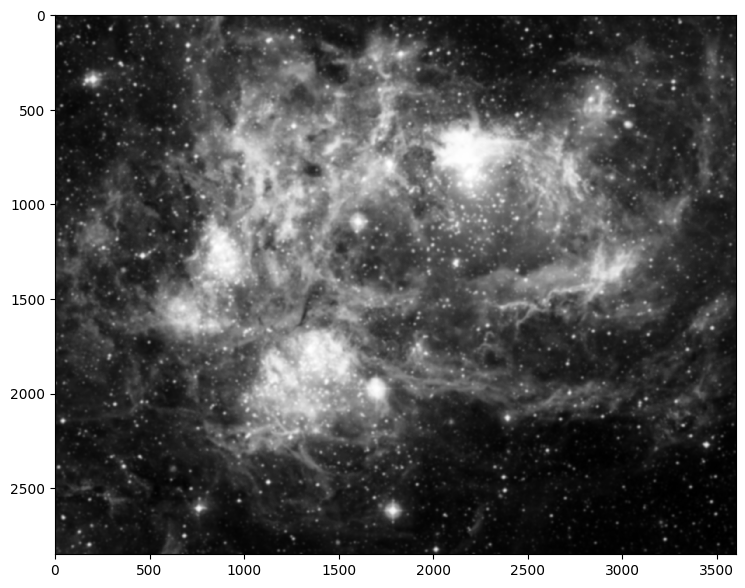

In [27]:
# -- smooth in row and column by 5
imgLsm = gf(imgL, 5)
plt.imshow(imgLsm)

Notice that the small scale structures have been smoothed over.  But if we subtract this smoothed version from the original version, we'll be left with **only** the small scale structures,

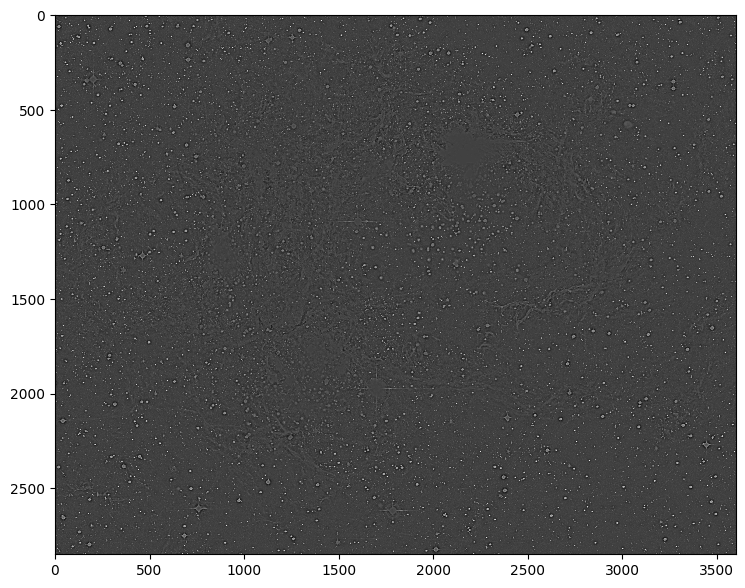

In [ ]:
# -- plot the difference between the original image and the smoothed image
hpfL = imgL - imgLsm
plt.imshow(hpfL)

This image (i.e., the image minus a smoothed version of the image) is referred to as the **high-pass filtered** image.

If we add this back to the *original* image, it will boost the small scale information in the image, resulting in a **sharper** image,

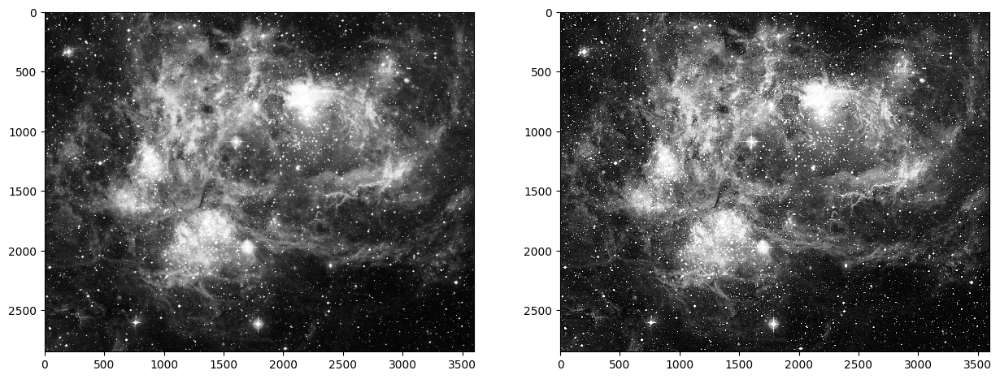

In [ ]:
# -- sharpen the luminosity image (note the use of the clip function)
imgLsh = (imgL + hpfL).clip(0, 1)

# -- plot it
fig, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(imgL)
ax[1].imshow(imgLsh)

fig.show()

Note that we need to `clip()` to keep each pixel between 0 and 1.  We can do the same in 3-colors,

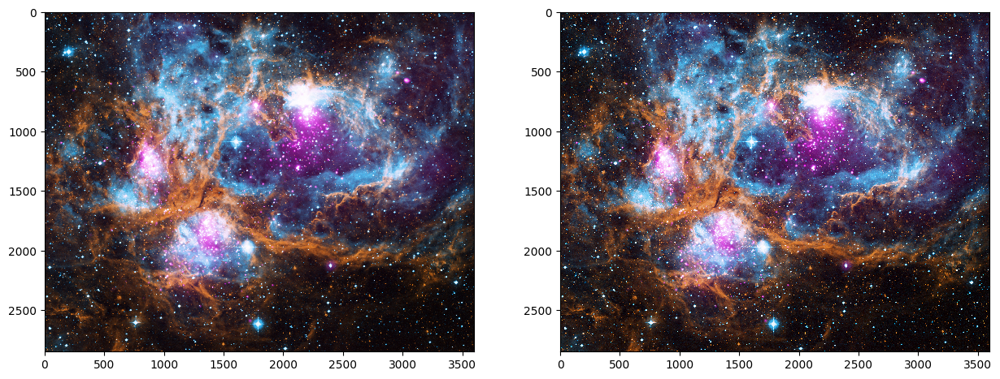

In [ ]:
# -- create 3 color high pass filter image
hpf = (img - gf(img, (2, 2, 0)))

# -- add back to the original image (and clip)
imgsh = (img + hpf).clip(0, 1)

# -- plot it
fig, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(img)
ax[1].imshow(imgsh)
fig.show()

Note, using high frequency information from one image to boost regions of another image can have interesting effects:

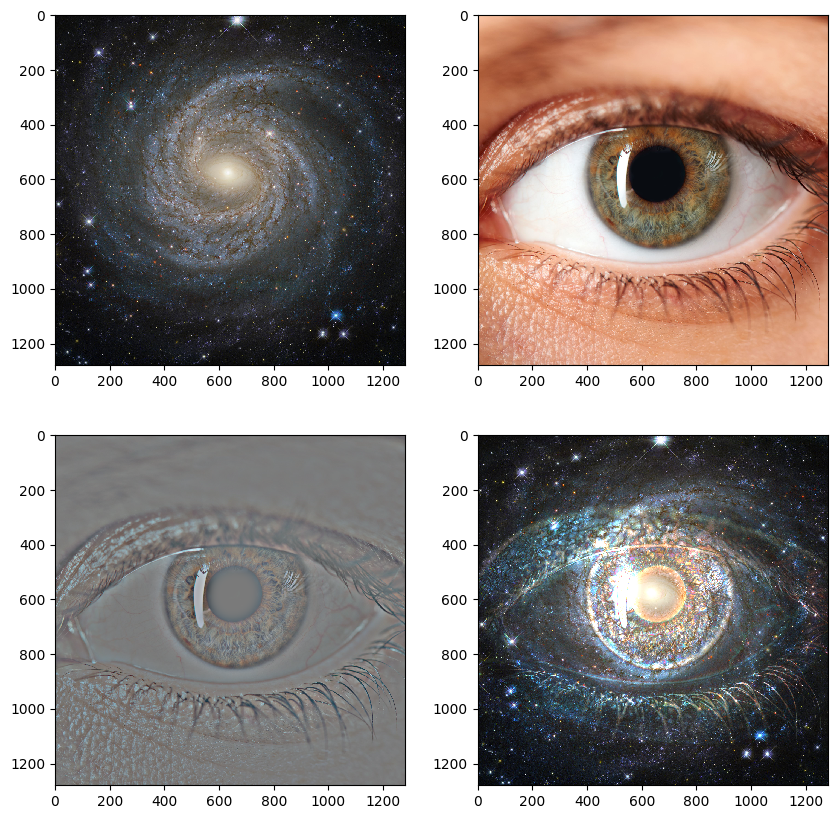

In [16]:
# -- set image names
# gname = "https://mk0astronomynow9oh6g.kinstacdn.com/wp-content/uploads/2016/05/NGC6814_1280x1280.jpg"
gname = "/content/drive/MyDrive/CVPS20/data/NGC6814_1280_1280.jpg"
ename = "https://images2.minutemediacdn.com/image/upload/c_crop,h_2576,w_3829,x_17,y_0/v1554738420/shape/mentalfloss/539787-istock-491410716.jpg?itok=Ru4ok5yC"

# -- read images
gal = np.asarray(iio.v2.imread(gname)) / 255.
eye = np.asarray(iio.v2.imread(ename))[:2560:2, 404:-865:2] / 255.

# -- high-pass filter eye and min/max normalize
eye_hp = eye - gf(eye, (20, 20, 0))
eye_hp = (eye_hp - eye_hp.min()) / (eye_hp.max() - eye_hp.min())

# -- blend galaxy image and high-pass filtered eye
bln = (gal + 10. * gal * np.abs(eye_hp - 0.5)).clip(0, 1)

# -- plot it
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
ax[0, 0].imshow(gal)
ax[0, 1].imshow(eye)
ax[1, 0].imshow(eye_hp)
ax[1, 1].imshow(bln)
fig.show()

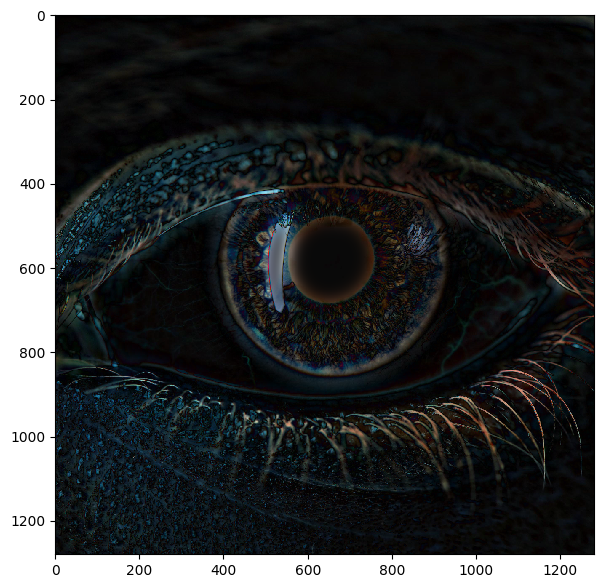

In [119]:
plt.imshow(np.abs(eye_hp - 0.5)*2)

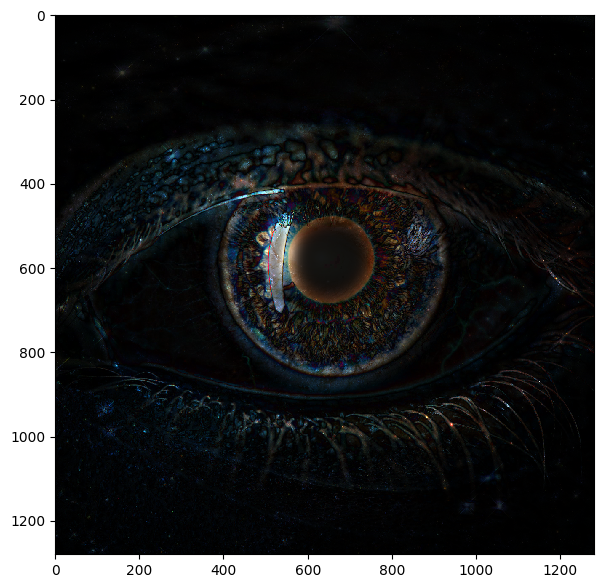

In [116]:
plt.imshow((gal * np.abs(eye_hp - 0.5) * 5).clip(0,1))

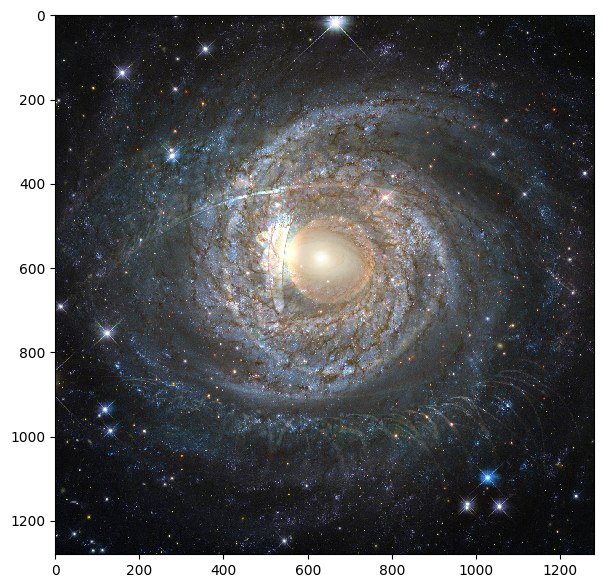

In [132]:
plt.imshow(gal + gal * np.abs(eye_hp - 0.5) * 3)

# Another Try

In [7]:
from scipy.ndimage import center_of_mass
from skimage.transform import resize

In [14]:
gname = "/content/drive/MyDrive/CVPS20/data/NGC6814_1280_1280.jpg"
gal = np.asarray(iio.v2.imread(gname)) / 255

In [9]:
ename = "https://images2.minutemediacdn.com/image/upload/c_crop,h_2576,w_3829,x_17,y_0/v1554738420/shape/mentalfloss/539787-istock-491410716.jpg?itok=Ru4ok5yC"
eye_full = np.asarray(iio.v2.imread(ename)) / 255
shape = eye_full.shape
print(shape)

# eye_full = resize(eye_full, (shape[0]/1.65, shape[1]/1.65))
# print(eye_full.shape)

(2576, 3829, 3)


In [10]:
eye_full.max()

1.0

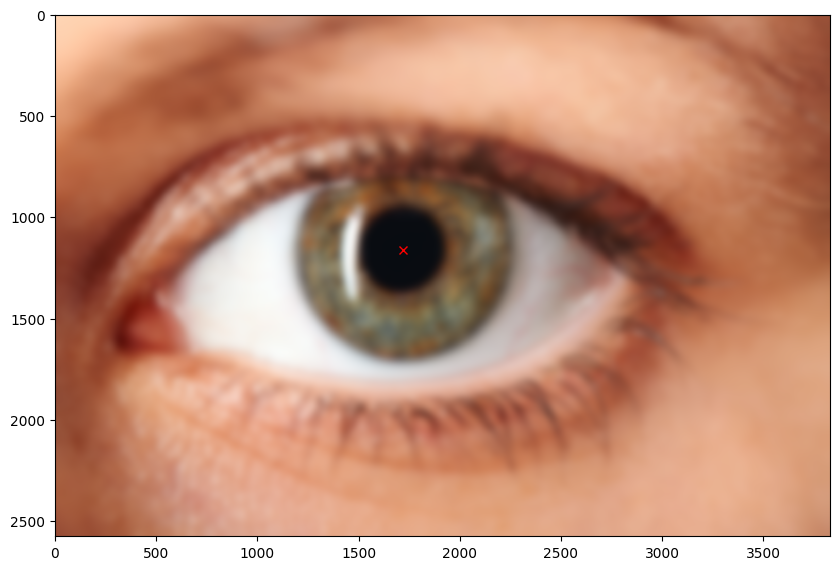

In [11]:
eye_gf = gf(eye_full, (20, 20, 0))
plt.imshow(eye_gf)

y0_eye, x0_eye = center_of_mass(eye_gf.mean(axis=-1)<0.1)
plt.plot(x0_eye, y0_eye, 'rx')

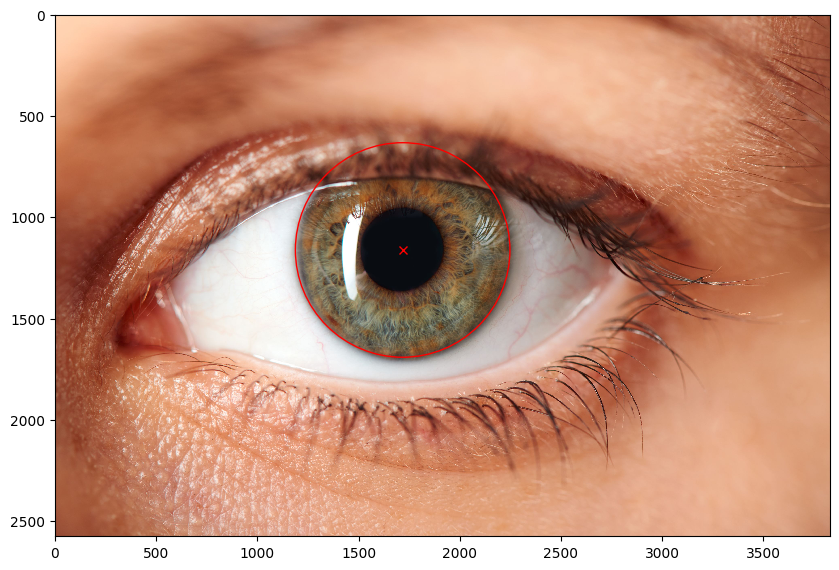

In [12]:
# prompt: #plot a circle around x0_eye and y0_eye

import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.imshow(eye_full)
ax.plot(x0_eye, y0_eye, 'rx')
circle = plt.Circle((x0_eye, y0_eye), radius=530, color='r', fill=False)
ax.add_patch(circle)
plt.show()


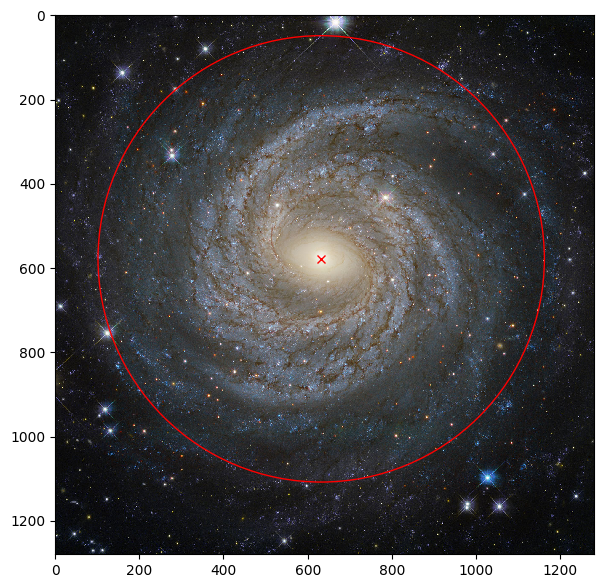

In [15]:
gal_gf = gf(gal, (20, 20, 0))
y0_gal, x0_gal = center_of_mass(gal_gf.mean(axis=-1)>0.8)

fig, ax = plt.subplots()
ax.imshow(gal)
ax.plot(x0_gal, y0_gal, 'rx')
circle = plt.Circle((x0_gal, y0_gal), radius=530, color='r', fill=False)
ax.add_patch(circle)
plt.show()

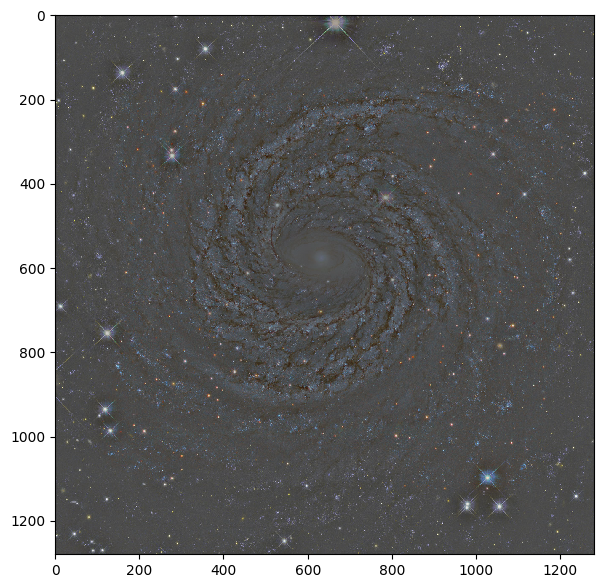

In [16]:
gal_hp = gal - gf(gal, (20, 20, 0))
gal_hp = (gal_hp - gal_hp.min()) / (gal_hp.max() - gal_hp.min())
plt.imshow(gal_hp)

In [18]:
x_offset = int(x0_eye - x0_gal)
y_offset = int(y0_eye - y0_gal)
galshape = gal.shape

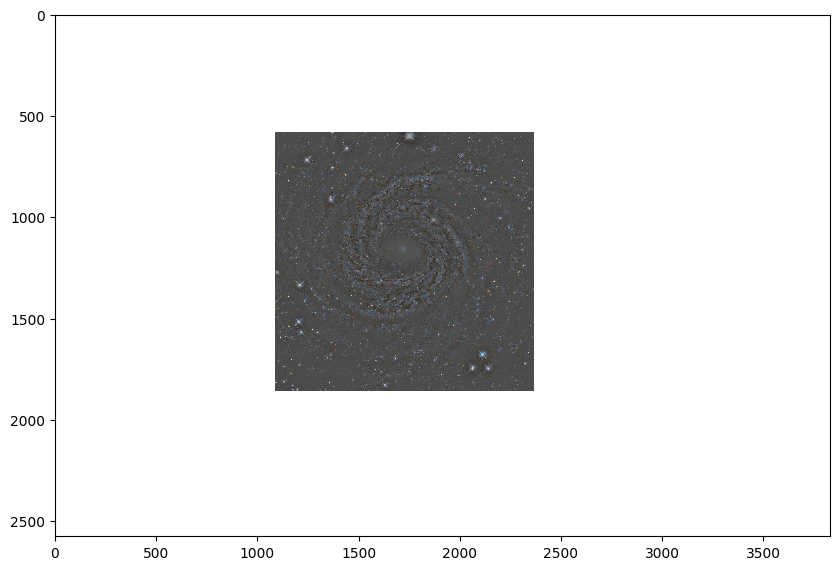

In [211]:
gal_hp_extend = np.ones(eye_full.shape)
gal_hp_extend[ y_offset:y_offset+galshape[0], x_offset:x_offset+galshape[1]] = gal_hp
plt.imshow(gal_hp_extend)

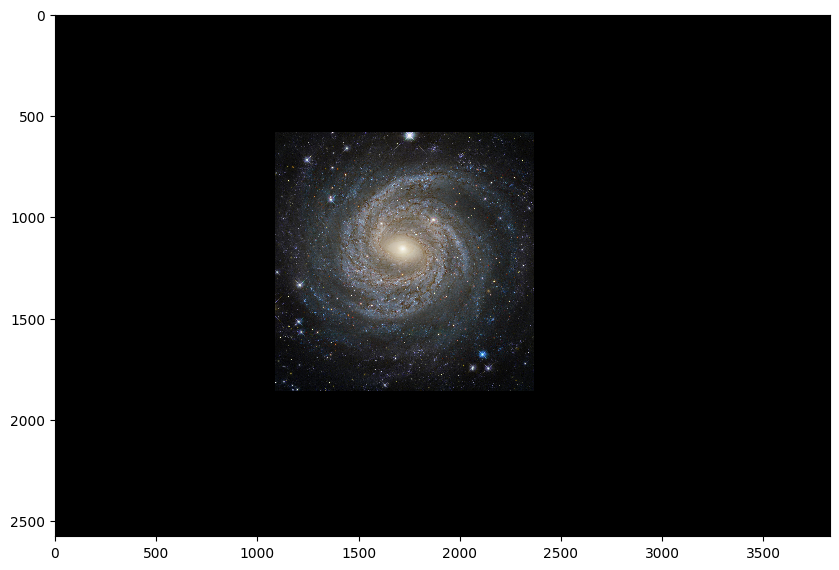

In [19]:
gal_extend = np.zeros(eye_full.shape)
gal_extend[ y_offset:y_offset+galshape[0], x_offset:x_offset+galshape[1]] = gal
plt.imshow(gal_extend)

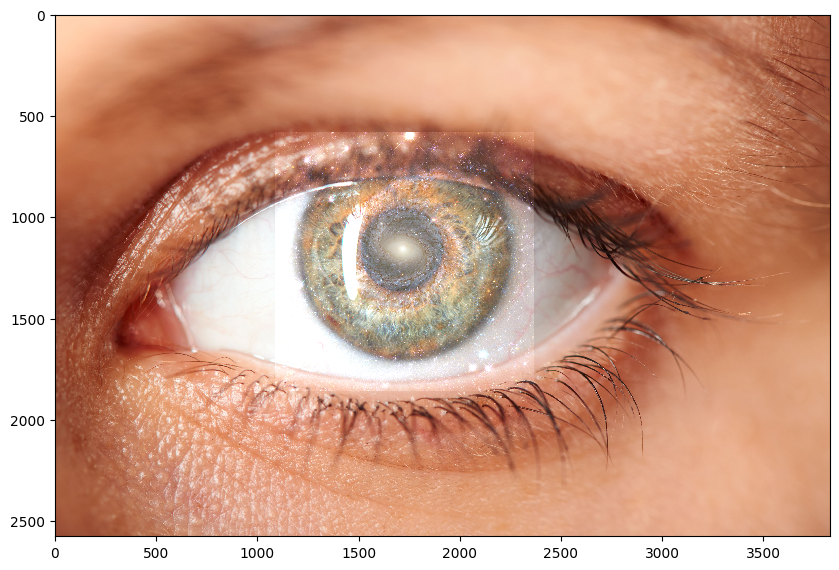

In [213]:
plt.imshow(eye_full + gal_extend)

In [20]:
r = 530
x = np.arange(eye_full.shape[1])
y = np.arange(eye_full.shape[0])
xx, yy = np.meshgrid(x, y)
rr = np.sqrt((xx-x0_eye)**2 + (yy-y0_eye)**2)

sigma = r/2
mask = np.exp( rr**2 / (-2*sigma**2) )
# / (2*np.pi * sigma**2)

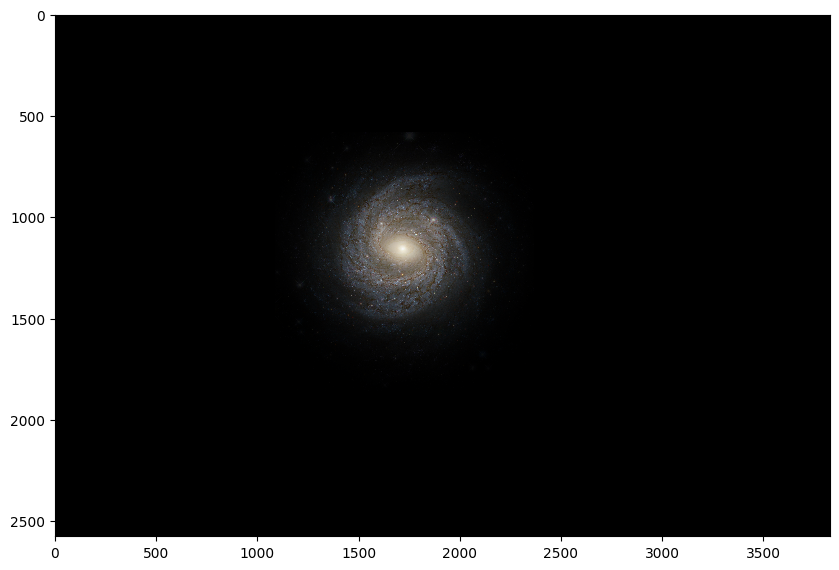

In [269]:
plt.imshow(gal_extend * np.stack([mask]*3, axis=-1) )

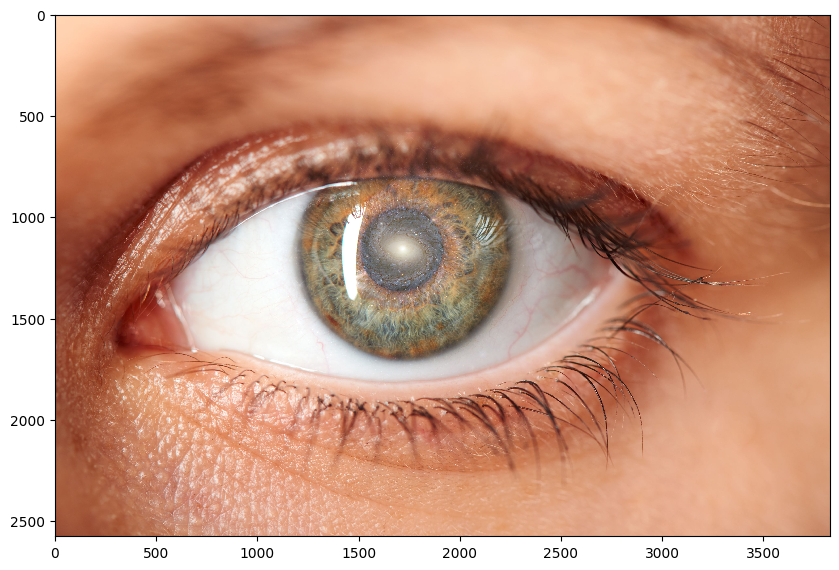

In [270]:
plt.imshow(eye_full + gal_extend * np.stack([mask]*3, axis=-1))

In [21]:
mask_rgb = np.stack([mask]*3, axis=-1)

img1 = gal_extend * mask_rgb
img2 = eye_full * (1-mask_rgb)

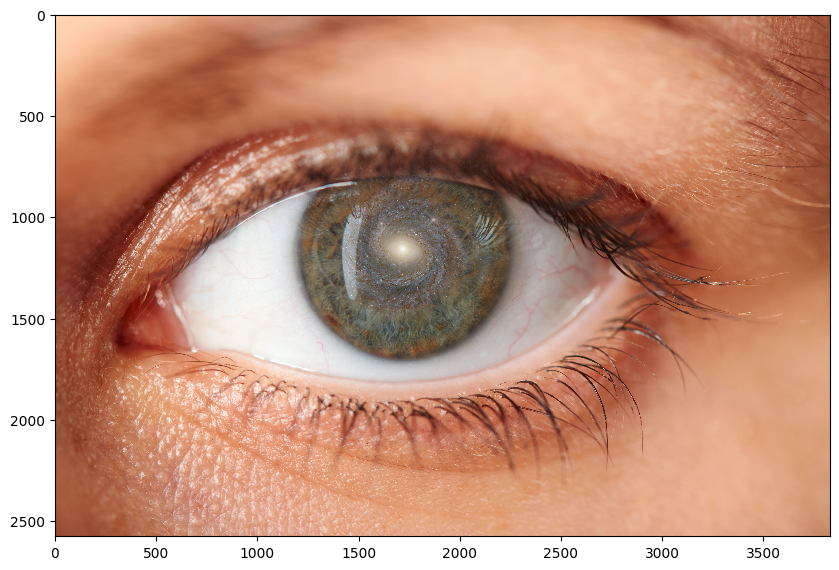

In [22]:
plt.imshow(img1 + img2)

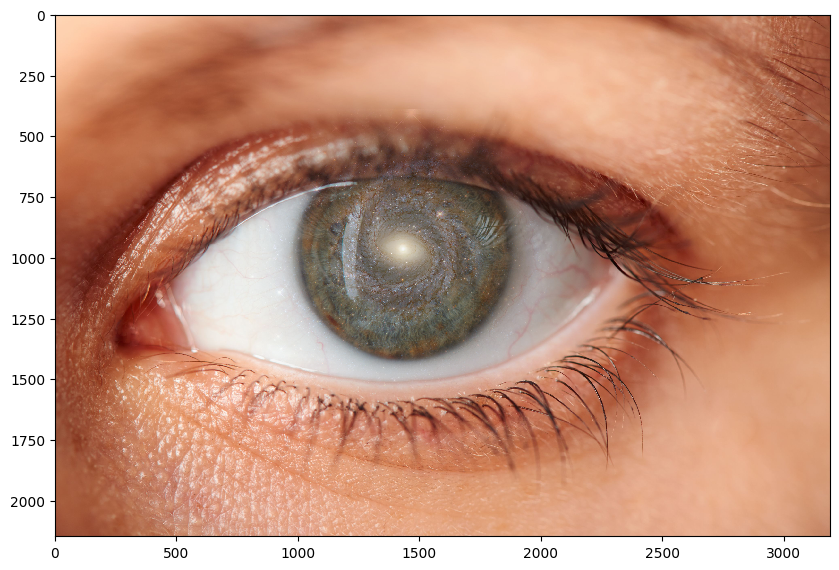

In [24]:
eye_full_1 = resize(eye_full, (shape[0]/1.2, shape[1]/1.2))

img_eye = eye_full_1

y0_eye, x0_eye = center_of_mass(gf(img_eye, (20, 20, 0)).mean(axis=-1)<0.1)
y0_gal, x0_gal = center_of_mass(gf(gal, (20, 20, 0)).mean(axis=-1)>0.8)

x_offset = int(x0_eye - x0_gal)
y_offset = int(y0_eye - y0_gal)
galshape = gal.shape

gal_extend = np.zeros(img_eye.shape)
gal_extend[ y_offset:y_offset+galshape[0], x_offset:x_offset+galshape[1]] = gal

r = 530
x = np.arange(img_eye.shape[1])
y = np.arange(img_eye.shape[0])
xx, yy = np.meshgrid(x, y)
rr = np.sqrt((xx-x0_eye)**2 + (yy-y0_eye)**2)

sigma = r/2
mask = np.exp( rr**2 / (-2*sigma**2) )
# / (2*np.pi * sigma**2)

mask_rgb = np.stack([mask]*3, axis=-1)

img1 = gal_extend * mask_rgb
img2 = img_eye * (1-mask_rgb)

plt.imshow(img1 + img2)